# CGG Seep Oil Seep Detection Exercise

This exercise involves image segmentation for oil seep detection using synthetic aperture radar (SAR) images. The images are 256x256 pixels, and each pixel is classified as either non-seep (0) or one of seven classes of seeps (1-7). The objective is to segment regions containing seeps and optionally classify the seeps.

## How to Run the Code

To run this code, you need to upload the `seep_detection.tar.gz` file to Google Colab. The code is designed to utilize GPU for faster processing. Follow these steps:

1. Open Google Colab and create a new notebook.
2. Upload the `seep_detection.tar.gz` file to the Colab environment.
3. Ensure the notebook is set to use GPU by navigating to `Runtime > Change runtime type > GPU`.
4. Run the full code provided below in the Colab notebook.

## Dataset and DataLoader Setup

In this section, we set up the dataset and data loaders for the seep detection task using PyTorch. This involves defining a custom `DataFolder` class to handle loading and preprocessing of the images and masks, and creating data loaders for training, validation, and evaluation.

## UNet Model Definition

We define a UNet model for the seep detection task. The UNet architecture is commonly used for image segmentation tasks due to its ability to capture both low-level and high-level features through its encoder-decoder structure.

### UNet Architecture

1. **Encoder**: The encoder consists of four convolutional blocks that progressively downsample the input image and capture its features at different scales.
   - `conv_block` is used to define each convolutional block.
   - Layers: `encoder1` (64 channels), `encoder2` (128 channels), `encoder3` (256 channels), `encoder4` (512 channels).
2. **Bottleneck**: The bottleneck layer connects the encoder and decoder, providing a bridge where the most compressed feature representation of the input image is obtained.
   - Layers: `bottleneck` (1024 channels).
3. **Decoder**: The decoder consists of four upsampling blocks that progressively reconstruct the image from the bottleneck features, combining them with corresponding features from the encoder through skip connections.
   - Layers: `upconv4`, `decoder4` (512 channels), `upconv3`, `decoder3` (256 channels), `upconv2`, `decoder2` (128 channels), `upconv1`, `decoder1` (64 channels).
4. **Final Convolution**: A final 1x1 convolution layer maps the output to the desired number of classes.
   - Layer: `final_conv` (8 classes).

## Early Stopping

An `EarlyStopping` class is defined to monitor the validation loss and stop training when the model stops improving. This helps prevent overfitting and ensures the model is saved at its best state.

## Training and Validation Functions

- `train_one_epoch`: Trains the model for one epoch and calculates the average training loss.
- `validate_one_epoch`: Validates the model for one epoch and calculates the average validation loss.

## Model Training

The `train_model` function handles the entire training process, including calling the training and validation functions for each epoch, checking the early stopping criterion, and saving the best model.

## Model Evaluation

The `evaluate_model` function evaluates the model on the evaluation dataset and calculates the average evaluation loss.

## Prediction and Visualization

- `save_predictions`: Saves the prediction masks to the specified output directory.
- `visualize_prediction`: Visualizes the input image, ground truth mask, and prediction mask.
- `predict_and_save`: Generates predictions for the entire dataset, calculates the prediction loss, saves the predictions, and visualizes them.

### Hyperparameters

- `epochs`: 300
- `lr`: 0.001
- `patience`: 10
- `min_delta`: 0.001

### Example Usage

The code demonstrates how to create an instance of the UNet model, set up the optimizer and loss function, and call the `train_model` and `predict_and_save` functions to train, evaluate, and generate predictions.

## Future Improvements

1. **Handling Class Imbalance**: The masks in the dataset are class imbalanced, meaning some classes are underrepresented compared to others. This can affect the model's ability to learn effectively for all classes. To address this, we could use the Dice coefficient or a weighted loss function for cross-entropy, which gives more importance to the underrepresented classes and improves overall performance.


2. **Learning Rate Scheduling**: Implementing learning rate scheduling can help the model converge better. By reducing the learning rate when the validation loss plateaus, we can ensure the model continues to make small, incremental improvements rather than oscillating or getting stuck in suboptimal states.


3. **Metrics**: In addition to loss, using metrics such as Intersection over Union (IoU) or Dice coefficient would provide a better understanding of the model's segmentation performance. These metrics are particularly useful for segmentation tasks as they measure the overlap between the predicted and ground truth masks, giving a more comprehensive view of how well the model is performing.


# Data Preparation for Seep Detection

In this notebook, we will prepare the dataset for the seep detection task. The dataset is provided as a tar file containing images and corresponding masks. We will extract the tar file, create train, validation, and evaluation splits, and copy the files to their respective directories.

The data consists of synthetic aperture radar (SAR) images chosen at various locations. The images are 256 x 256 pixels, and each pixel is classified as either non-seep (0) or one of seven classes of seeps (1-7). The SAR images and their corresponding masks are saved as .tif files with the same names but in separate folders: `train_images_256/` and `train_masks_256/`.

The objective of this exercise is to segment regions that contain seeps and, as an optional task, to classify the seeps. We will split the dataset such that 80% is used for training, 10% for validation, and 10% for evaluation, ensuring all images are used for prediction.


In [ ]:
import tarfile
import os
import shutil
import glob
import random

# Extract the tar file
tar_path = 'seep_detection.tar.gz'
with tarfile.open(tar_path, 'r:gz') as tar:
    tar.extractall()

# Define the paths
base_path = 'seep_detection/'
all_images_path = os.path.join(base_path, 'train_images_256')
all_masks_path = os.path.join(base_path, 'train_masks_256')

train_images_path = os.path.join(base_path, 'small_train_images_256')
train_masks_path = os.path.join(base_path, 'small_train_masks_256')
valid_images_path = os.path.join(base_path, 'valid_images_256')
valid_masks_path = os.path.join(base_path, 'valid_masks_256')
eval_images_path = os.path.join(base_path, 'eval_images_256')
eval_masks_path = os.path.join(base_path, 'eval_masks_256')

# Create directories
os.makedirs(train_images_path, exist_ok=True)
os.makedirs(train_masks_path, exist_ok=True)
os.makedirs(valid_images_path, exist_ok=True)
os.makedirs(valid_masks_path, exist_ok=True)
os.makedirs(eval_images_path, exist_ok=True)
os.makedirs(eval_masks_path, exist_ok=True)

# Get list of all image files
all_image_files = sorted(glob.glob(os.path.join(all_images_path, '*.tif')))

# Shuffle the files
random.shuffle(all_image_files)

# Calculate the split indices
total_files = len(all_image_files)
train_split = int(0.8 * total_files)
valid_split = int(0.1 * total_files)

# Split the files
train_files = all_image_files[:train_split]
valid_files = all_image_files[train_split:train_split + valid_split]
eval_files = all_image_files[train_split + valid_split:]

# Helper function to copy files
def copy_files(file_list, source_dir, target_image_dir, target_mask_dir):
    for file_path in file_list:
        file_name = os.path.basename(file_path)
        mask_file_path = os.path.join(source_dir.replace('images', 'masks'), file_name)

        shutil.copy(file_path, os.path.join(target_image_dir, file_name))
        shutil.copy(mask_file_path, os.path.join(target_mask_dir, file_name))

# Copy the files
copy_files(train_files, all_images_path, train_images_path, train_masks_path)
copy_files(valid_files, all_images_path, valid_images_path, valid_masks_path)
copy_files(eval_files, all_images_path, eval_images_path, eval_masks_path)

# Verify the split
print(f"All images: {len(os.listdir(all_images_path))}")

print(f"Training images: {len(os.listdir(train_images_path))}")
print(f"Validation images: {len(os.listdir(valid_images_path))}")
print(f"Evaluation images: {len(os.listdir(eval_images_path))}")


All images: 790
Training images: 632
Validation images: 79
Evaluation images: 79


# Dataset and DataLoader Setup for Seep Detection

In this section, we will set up the dataset and data loaders for the seep detection task using PyTorch. This involves defining a custom `DataFolder` class to handle loading and preprocessing of the images and masks, and creating data loaders for training, validation, and evaluation.

**DataFolder Class**: We will create a custom dataset class `DataFolder` to load images and masks from specified directories, apply necessary transformations, and return them in a format suitable for training. Additionally, we will set up data loaders for training, validation, and evaluation datasets with appropriate batch sizes and configurations.


In [ ]:
import zipfile
import os
import glob
import torch
import torch.utils.data as data
import numpy as np
from PIL import Image

# Import necessary libraries
import sys
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable

# DataFolder class
class DataFolder(data.Dataset):
    def __init__(self, image_path, mask_path):
        self.image_path = image_path
        self.mask_path = mask_path
        self.image_filenames = [os.path.basename(fn) for fn in glob.iglob(os.path.join(self.image_path, '*.tif'))]

    def __getitem__(self, index):
        image_id = self.image_filenames[index]

        image = Image.open(os.path.join(self.image_path, image_id)).convert('I;16')
        image = np.array(image, dtype=np.float32)
        image = image / (2**16 - 1)  # Normalize to the range [0, 1]
        image = torch.from_numpy(image)
        image = torch.unsqueeze(image, 0)

        mask = Image.open(os.path.join(self.mask_path, image_id)).convert('L')
        mask = np.array(mask, dtype=np.int64)
        mask = torch.from_numpy(mask).type(torch.LongTensor)

        return image, mask, image_id

    def __len__(self):
        return len(self.image_filenames)

train_batch_size = 16
eval_batch_size = 16


all_loader = data.DataLoader(
    dataset=DataFolder('seep_detection/train_images_256/', 'seep_detection/train_masks_256/'),
    batch_size=eval_batch_size,
    shuffle=False,
    num_workers=2
)

train_loader = data.DataLoader(
    dataset=DataFolder('seep_detection/small_train_images_256/', 'seep_detection/small_train_masks_256/'),
    batch_size=train_batch_size,
    shuffle=True,
    num_workers=2
)

valid_loader = data.DataLoader(
    dataset=DataFolder('seep_detection/valid_images_256/', 'seep_detection/valid_masks_256/'),
    batch_size=eval_batch_size,
    shuffle=False,
    num_workers=2
)

eval_loader = data.DataLoader(
    dataset=DataFolder('seep_detection/eval_images_256/', 'seep_detection/eval_masks_256/'),
    batch_size=eval_batch_size,
    shuffle=False,
    num_workers=2
)


# UNet Model Definition

In this section, we define a UNet model for the seep detection task. The UNet architecture is commonly used for image segmentation tasks due to its ability to capture both low-level and high-level features through its encoder-decoder structure.

## UNet Architecture:

1. **Encoder**: The encoder consists of four convolutional blocks that progressively downsample the input image and capture its features at different scales.
2. **Bottleneck**: The bottleneck layer connects the encoder and decoder, providing a bridge where the most compressed feature representation of the input image is obtained.
3. **Decoder**: The decoder consists of four upsampling blocks that progressively reconstruct the image from the bottleneck features, combining them with corresponding features from the encoder through skip connections.
4. **Final Convolution**: A final 1x1 convolution layer maps the output to the desired number of classes.

### Implementation Details:

- **conv_block**: A helper function to create a convolutional block consisting of two convolutional layers, batch normalization, and ReLU activation.
- **forward method**: Defines the forward pass of the network, where the input is processed through the encoder, bottleneck, and decoder, and the output is obtained through the final convolution layer.

### Example Usage:

An instance of the UNet model is created with 1 input channel (grayscale images) and 8 output classes (non-seep and 7 classes of seeps). The model is then moved to the GPU for training.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()
        self.encoder1 = self.conv_block(n_channels, 64)
        self.encoder2 = self.conv_block(64, 128)
        self.encoder3 = self.conv_block(128, 256)
        self.encoder4 = self.conv_block(256, 512)
        self.bottleneck = self.conv_block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = self.conv_block(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = self.conv_block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = self.conv_block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = self.conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, n_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(F.max_pool2d(e1, 2))
        e3 = self.encoder3(F.max_pool2d(e2, 2))
        e4 = self.encoder4(F.max_pool2d(e3, 2))

        b = self.bottleneck(F.max_pool2d(e4, 2))

        d4 = self.upconv4(b)
        d4 = torch.cat((d4, e4), dim=1)
        d4 = self.decoder4(d4)
        d3 = self.upconv3(d4)
        d3 = torch.cat((d3, e3), dim=1)
        d3 = self.decoder3(d3)
        d2 = self.upconv2(d3)
        d2 = torch.cat((d2, e2), dim=1)
        d2 = self.decoder2(d2)
        d1 = self.upconv1(d2)
        d1 = torch.cat((d1, e1), dim=1)
        d1 = self.decoder1(d1)

        out = self.final_conv(d1)
        return out

# Example usage:
model = UNet(n_channels=1, n_classes=8).cuda()

# Training, Evaluation, and Prediction for Seep Detection

In this section, we will cover the training, evaluation, and prediction processes for the seep detection task using a UNet model. The code includes setting up an early stopping mechanism, training the model, validating the model, evaluating the model, and visualizing predictions.

## Early Stopping

An `EarlyStopping` class is defined to monitor the validation loss and stop training when the model stops improving. This helps prevent overfitting and ensures the model is saved at its best state.

## Training and Validation Functions

- `train_one_epoch`: Trains the model for one epoch and calculates the average training loss.
- `validate_one_epoch`: Validates the model for one epoch and calculates the average validation loss.

## Model Training

The `train_model` function handles the entire training process, including calling the training and validation functions for each epoch, checking the early stopping criterion, and saving the best model.

## Model Evaluation

The `evaluate_model` function evaluates the model on the evaluation dataset and calculates the average evaluation loss.

## Prediction and Visualization

- `save_predictions`: Saves the prediction masks to the specified output directory.
- `visualize_prediction`: Visualizes the input image, ground truth mask, and prediction mask.
- `predict_and_save`: Generates predictions for the entire dataset, calculates the prediction loss, saves the predictions, and visualizes them.

### Hyperparameters

- `epochs`: Number of training epochs.
- `lr`: Learning rate for the optimizer.
- `patience`: Number of epochs with no improvement after which training will be stopped.
- `min_delta`: Minimum change in the monitored quantity to qualify as an improvement.

### Example Usage

The code demonstrates how to create an instance of the UNet model, set up the optimizer and loss function, and call the `train_model` and `predict_and_save` functions to train, evaluate, and generate predictions.


[EPOCH 1] Train Loss: 1.1936
[EPOCH 1] Valid Loss: 0.7857
Creating model directory: model
Saving current best model
Validation loss: 0.7857; Best validation loss so far: 0.7857; Consecutive non-improving epochs: 0
Epoch 1 completed in 33.21 seconds
[EPOCH 2] Train Loss: 0.3221
[EPOCH 2] Valid Loss: 0.2108
Saving current best model
Validation loss: 0.2108; Best validation loss so far: 0.2108; Consecutive non-improving epochs: 0
Epoch 2 completed in 34.25 seconds
[EPOCH 3] Train Loss: 0.1646
[EPOCH 3] Valid Loss: 0.1345
Saving current best model
Validation loss: 0.1345; Best validation loss so far: 0.1345; Consecutive non-improving epochs: 0
Epoch 3 completed in 33.51 seconds
[EPOCH 4] Train Loss: 0.1292
[EPOCH 4] Valid Loss: 0.1260
Saving current best model
Validation loss: 0.1260; Best validation loss so far: 0.1260; Consecutive non-improving epochs: 0
Epoch 4 completed in 33.69 seconds
[EPOCH 5] Train Loss: 0.1194
[EPOCH 5] Valid Loss: 0.1135
Saving current best model
Validation loss:

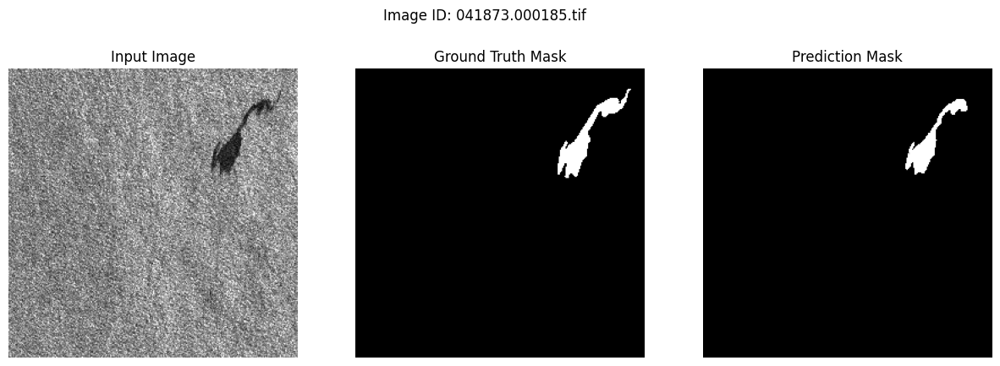

[PREDICT 1/50] Loss: 0.0830


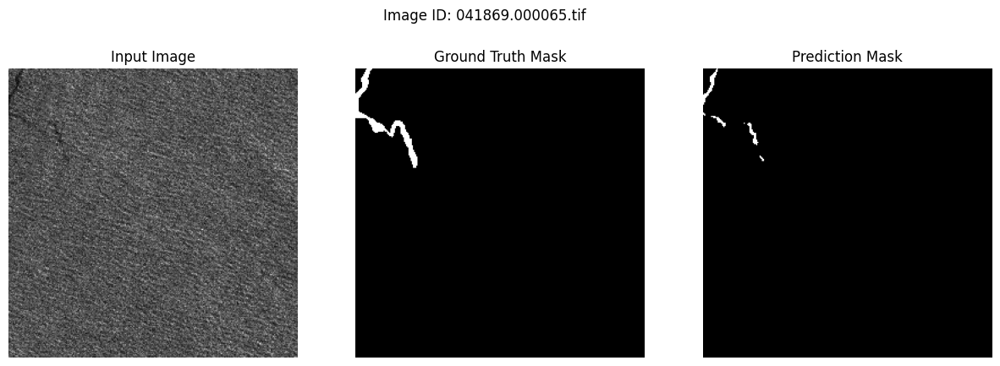

[PREDICT 2/50] Loss: 0.0380


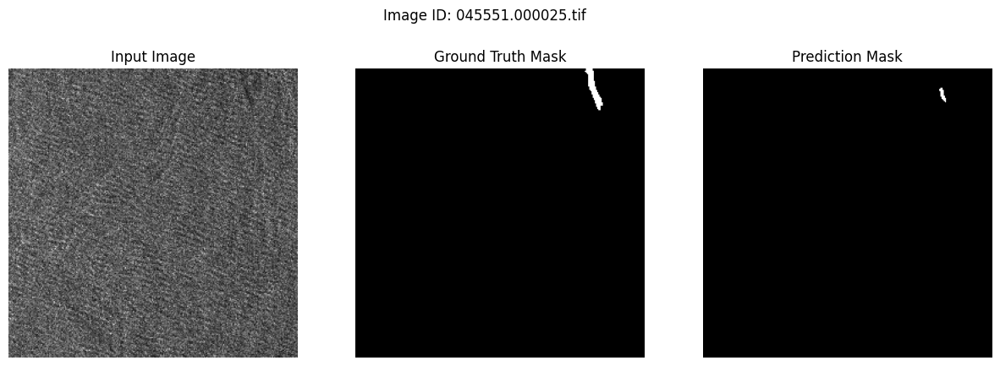

[PREDICT 3/50] Loss: 0.0532


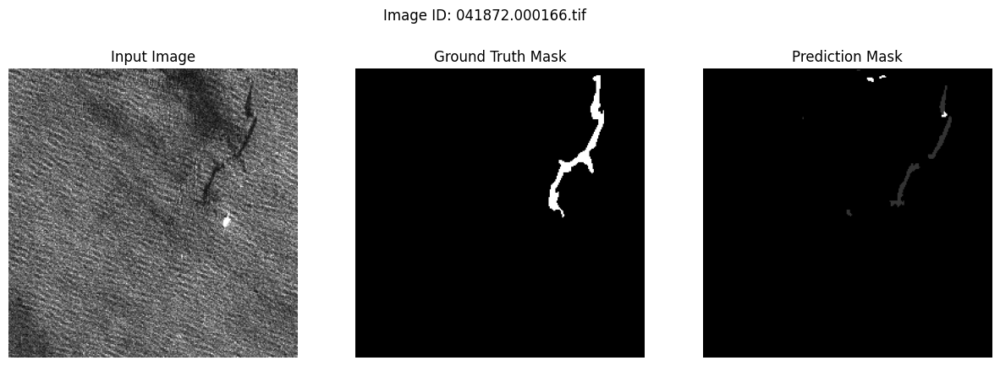

[PREDICT 4/50] Loss: 0.0714


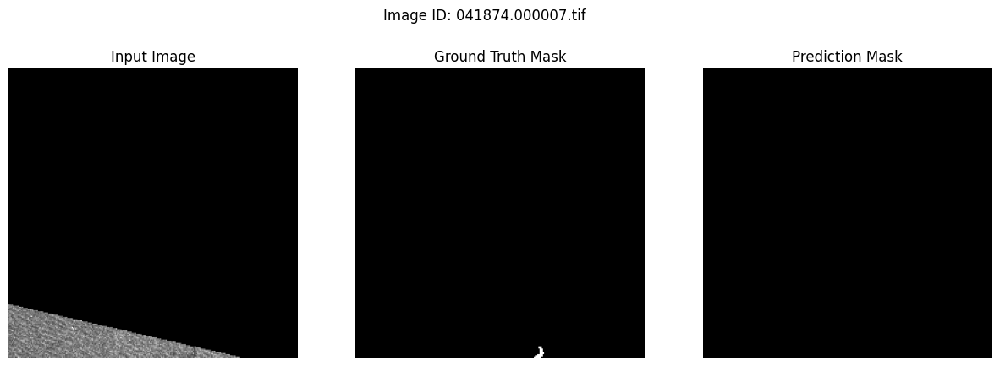

[PREDICT 5/50] Loss: 0.0379


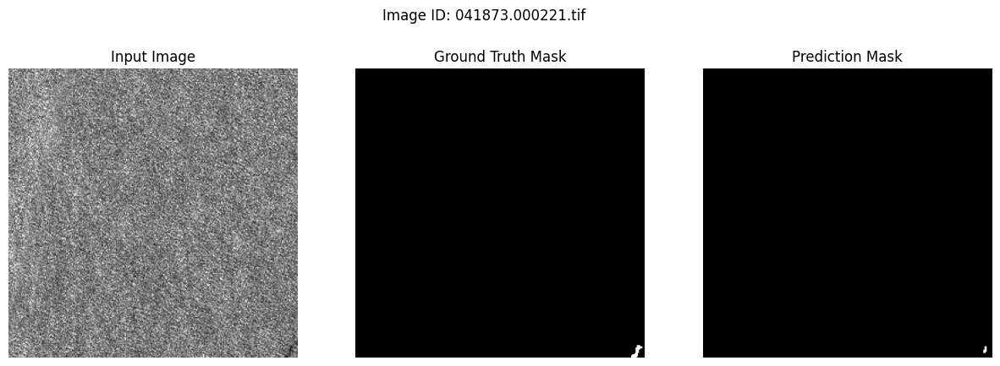

[PREDICT 6/50] Loss: 0.1019


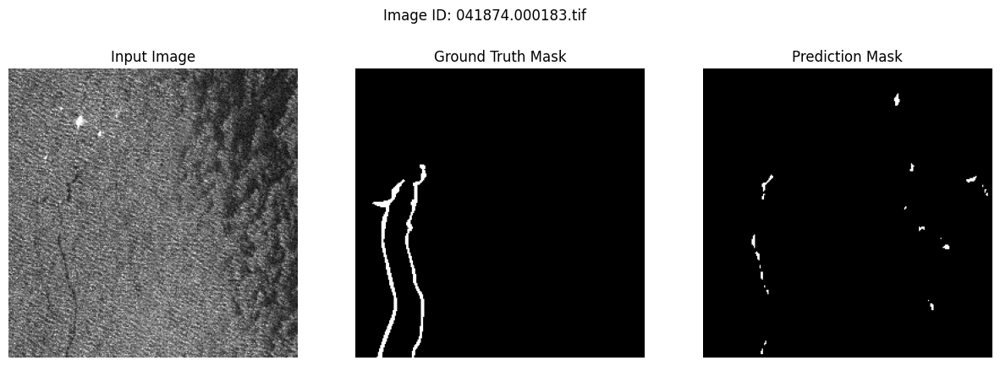

[PREDICT 7/50] Loss: 0.0387


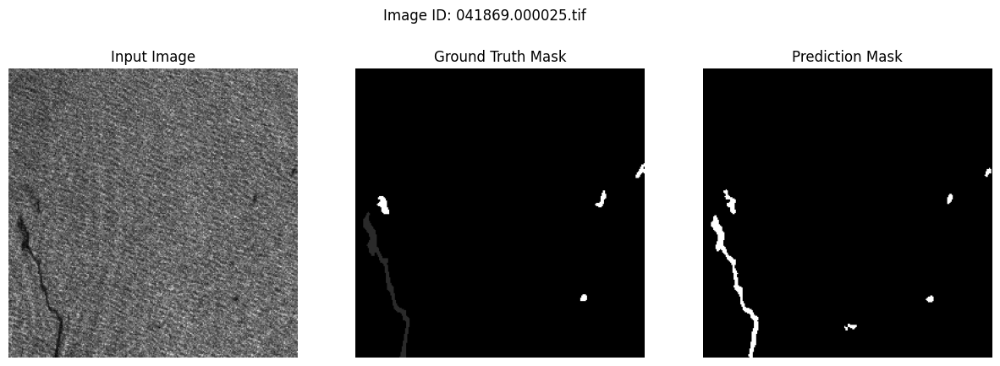

[PREDICT 8/50] Loss: 0.0688


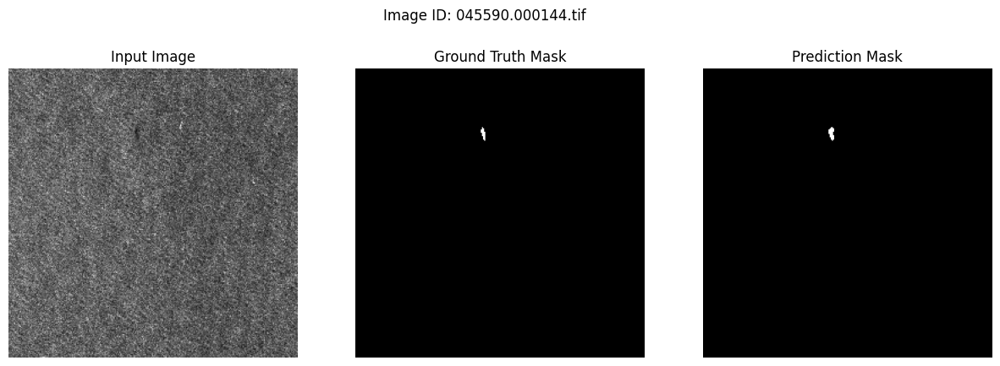

[PREDICT 9/50] Loss: 0.0378


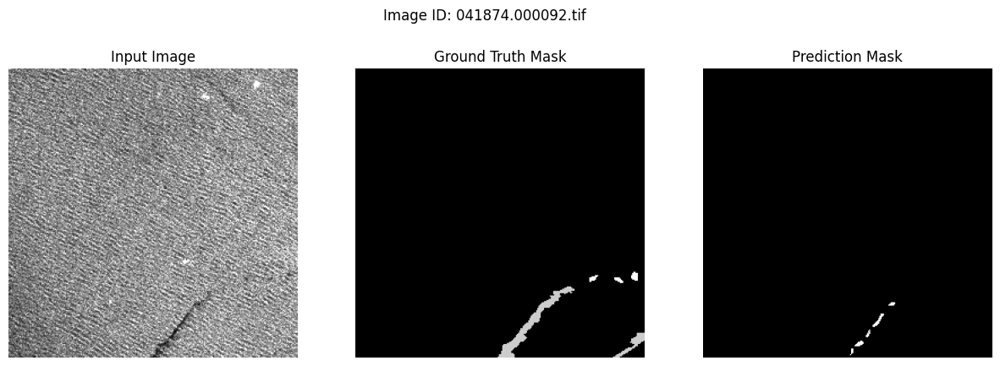

[PREDICT 10/50] Loss: 0.0482


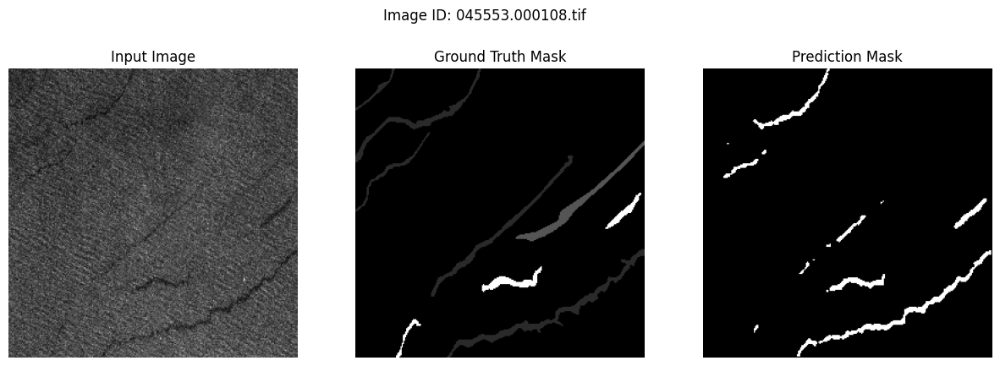

[PREDICT 11/50] Loss: 0.0710


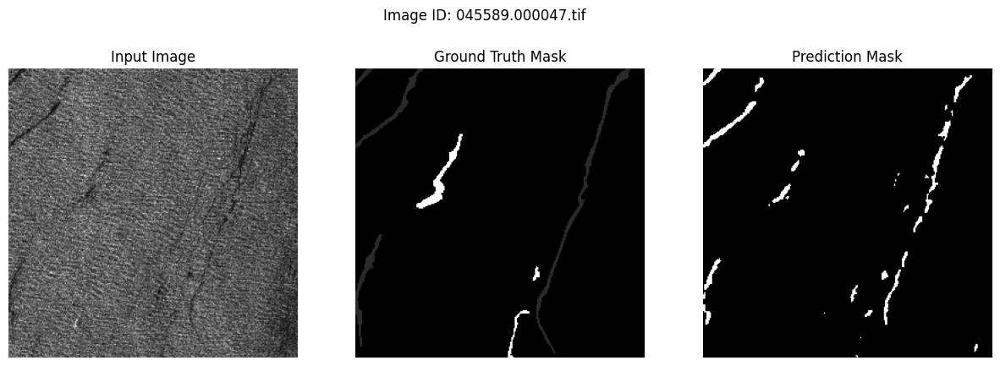

[PREDICT 12/50] Loss: 0.0473


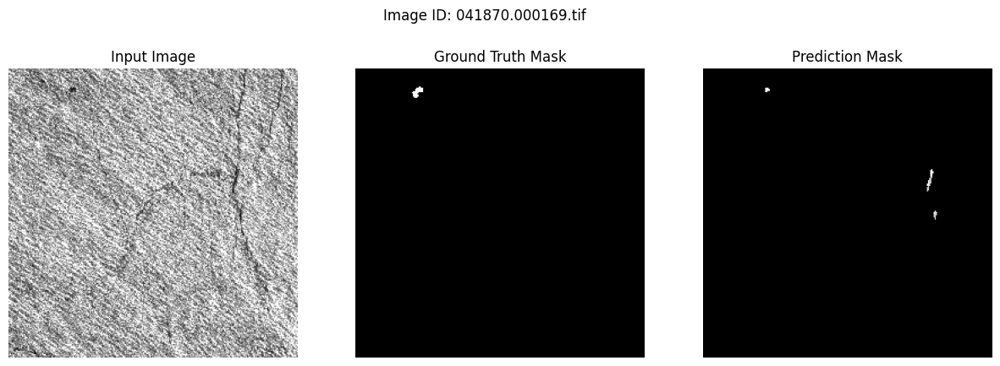

[PREDICT 13/50] Loss: 0.0683


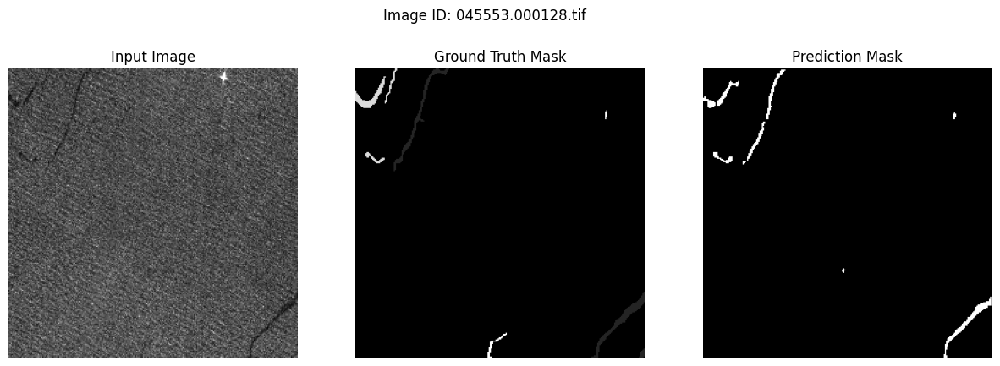

[PREDICT 14/50] Loss: 0.0583


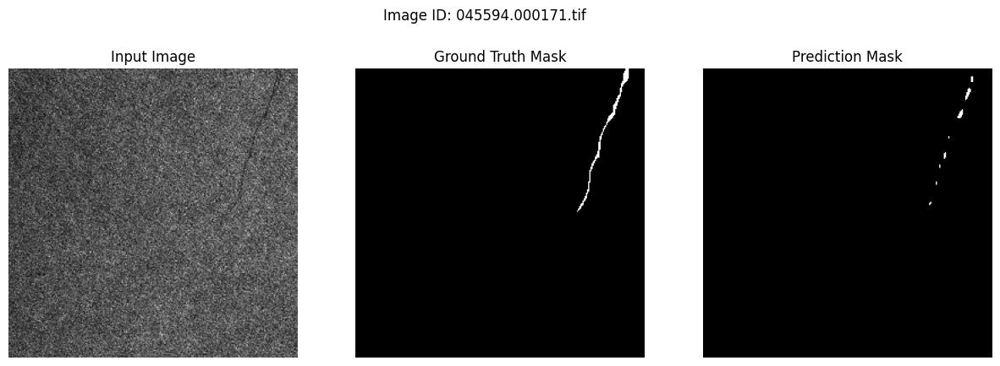

[PREDICT 15/50] Loss: 0.0419


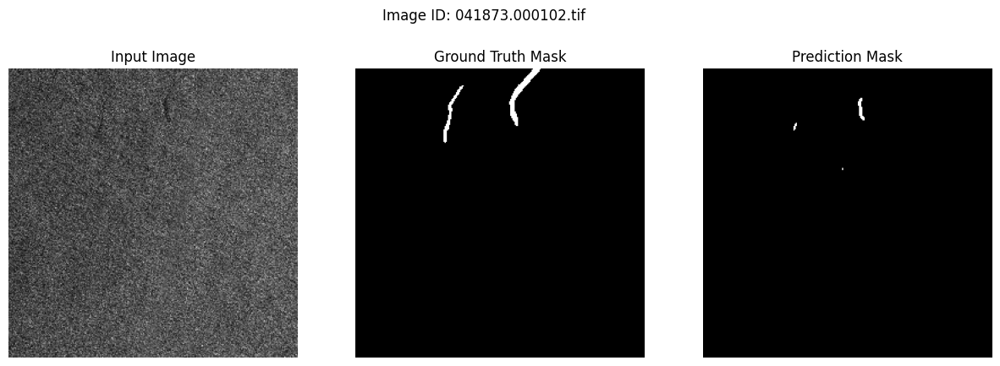

[PREDICT 16/50] Loss: 0.0357


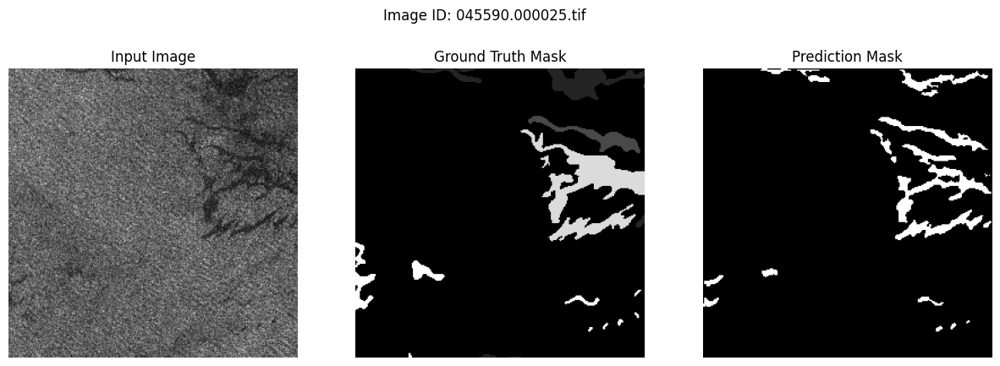

[PREDICT 17/50] Loss: 0.0848


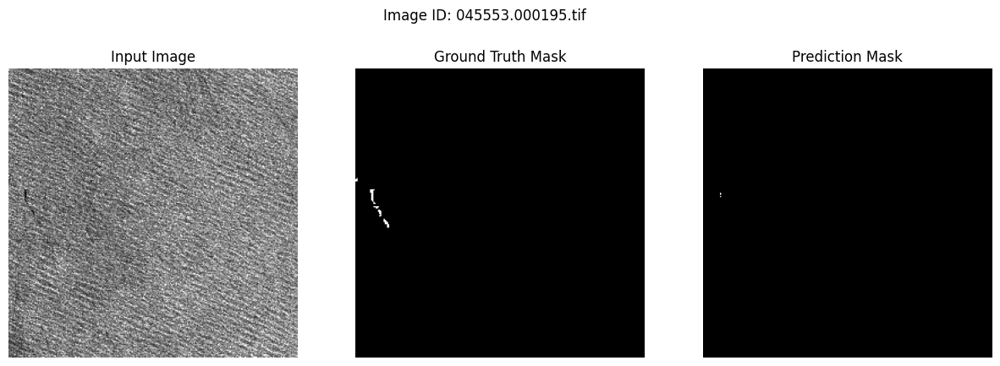

[PREDICT 18/50] Loss: 0.0542


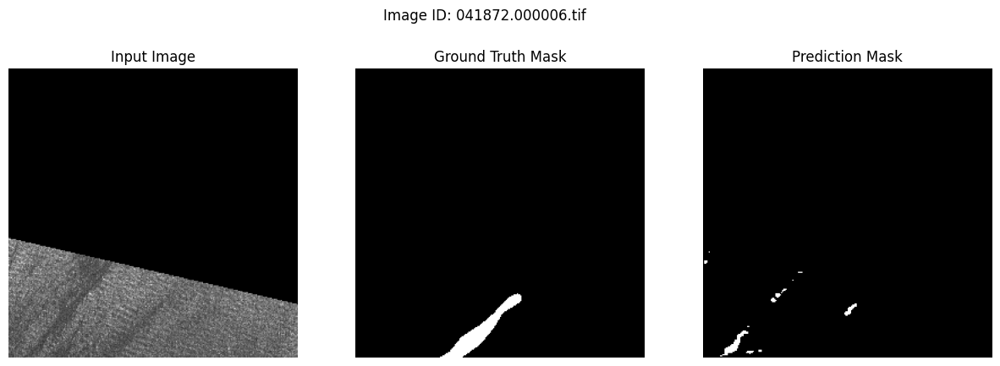

[PREDICT 19/50] Loss: 0.0639


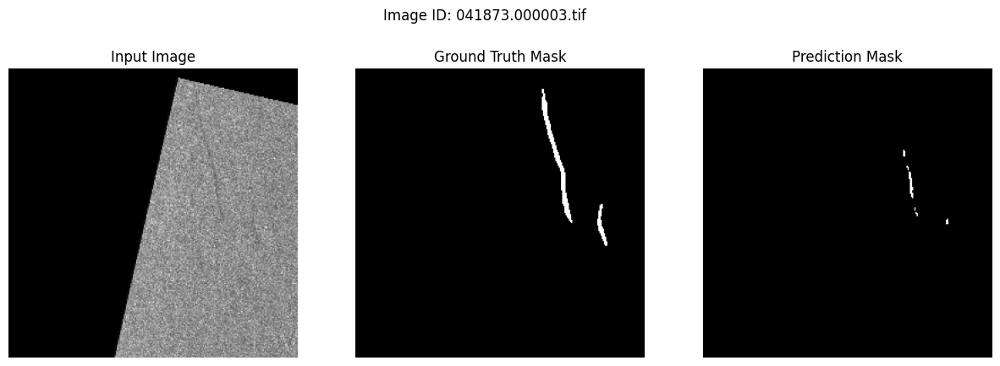

[PREDICT 20/50] Loss: 0.0549


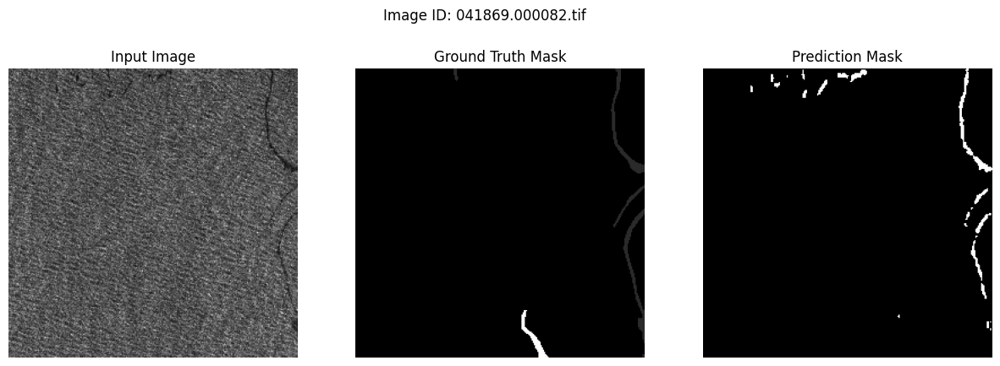

[PREDICT 21/50] Loss: 0.0538


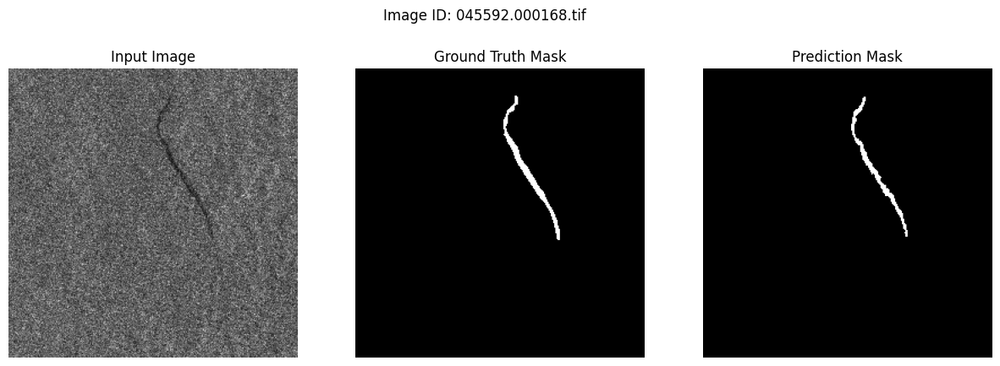

[PREDICT 22/50] Loss: 0.0535


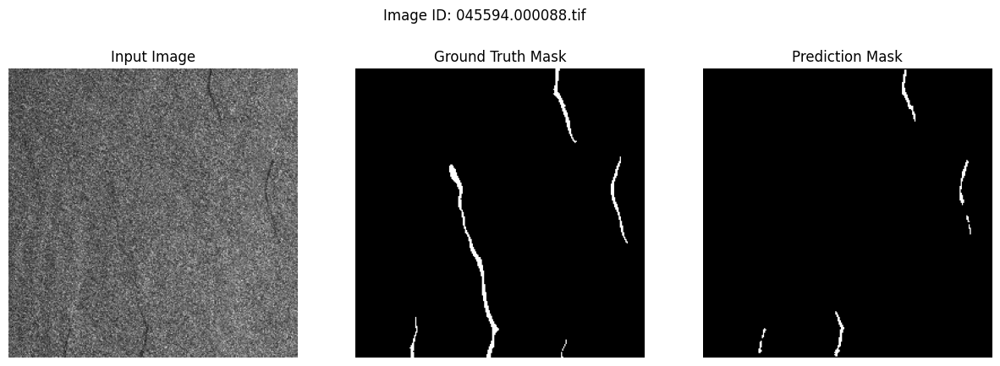

[PREDICT 23/50] Loss: 0.0664


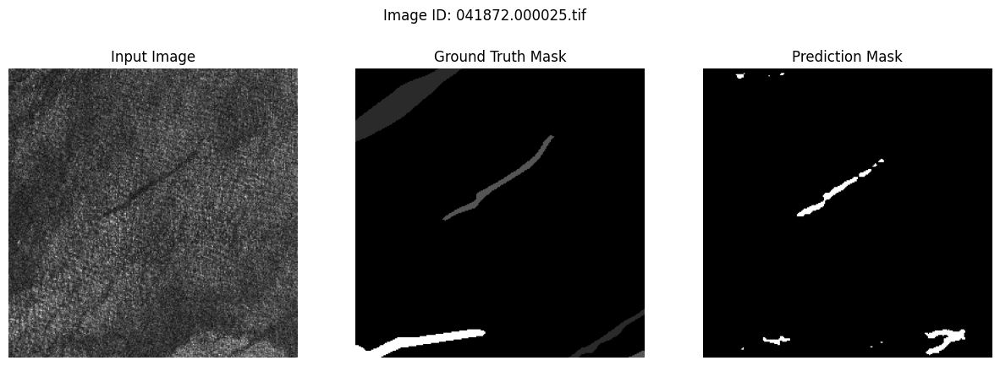

[PREDICT 24/50] Loss: 0.0952


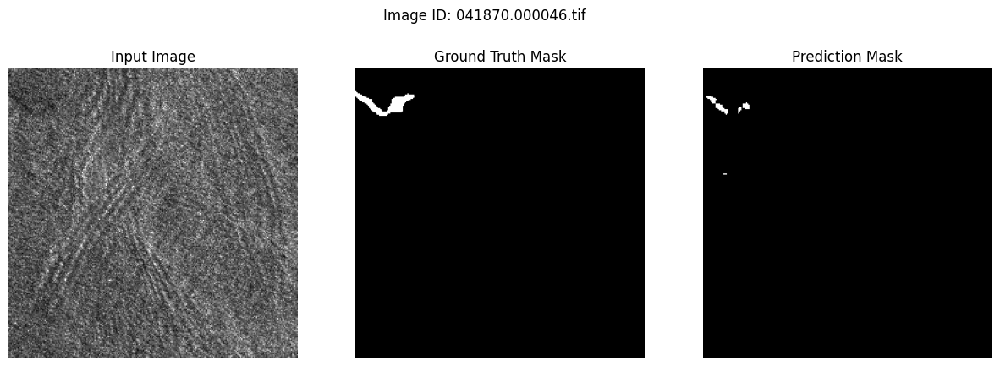

[PREDICT 25/50] Loss: 0.0584


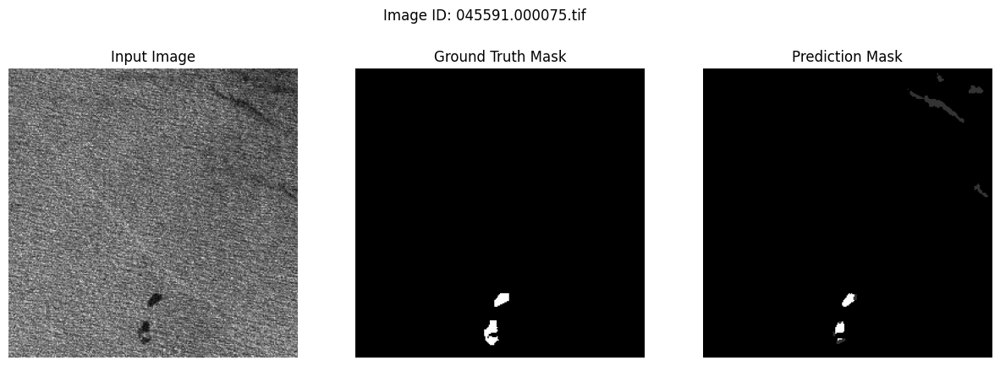

[PREDICT 26/50] Loss: 0.0393


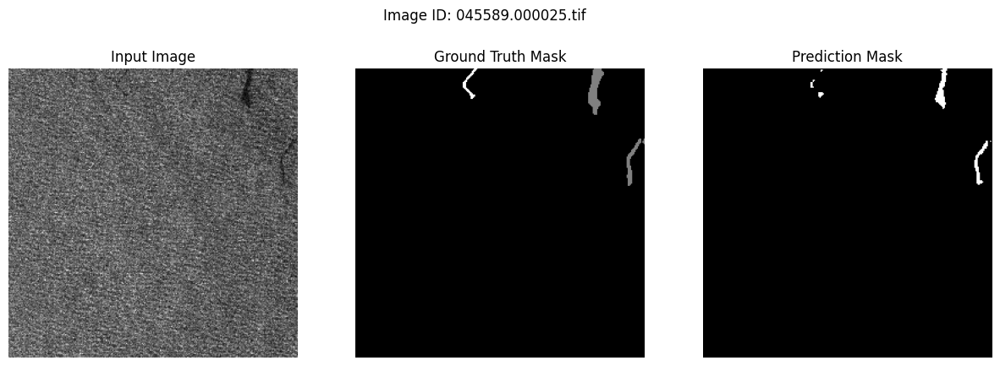

[PREDICT 27/50] Loss: 0.0388


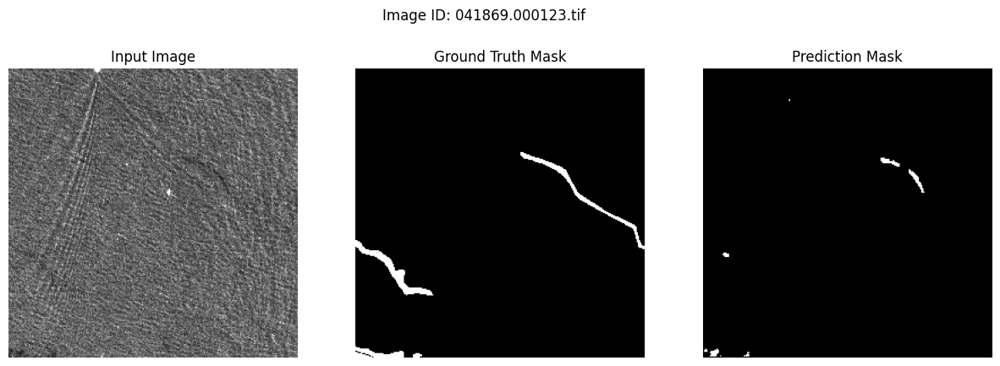

[PREDICT 28/50] Loss: 0.0693


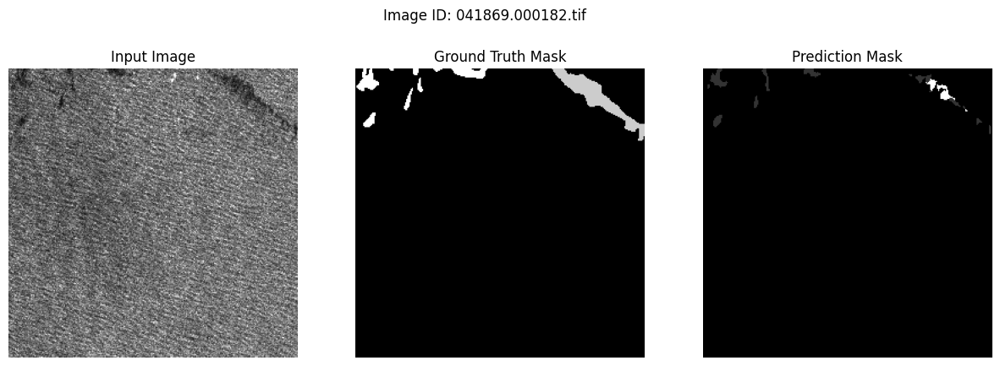

[PREDICT 29/50] Loss: 0.0481


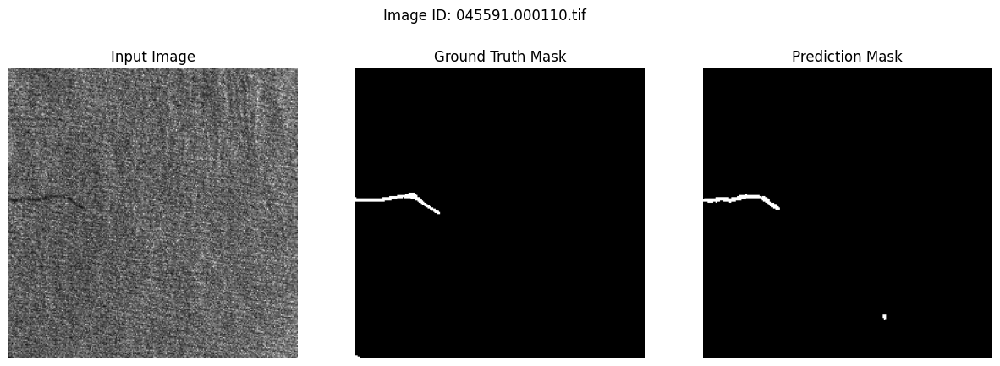

[PREDICT 30/50] Loss: 0.0354


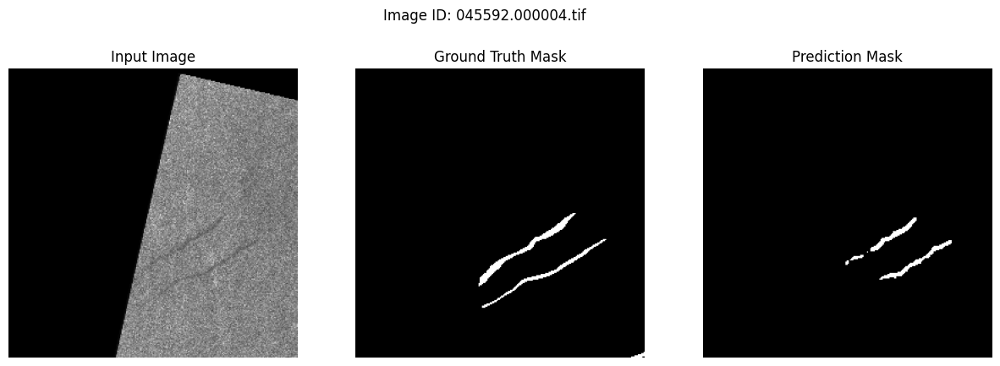

[PREDICT 31/50] Loss: 0.0333


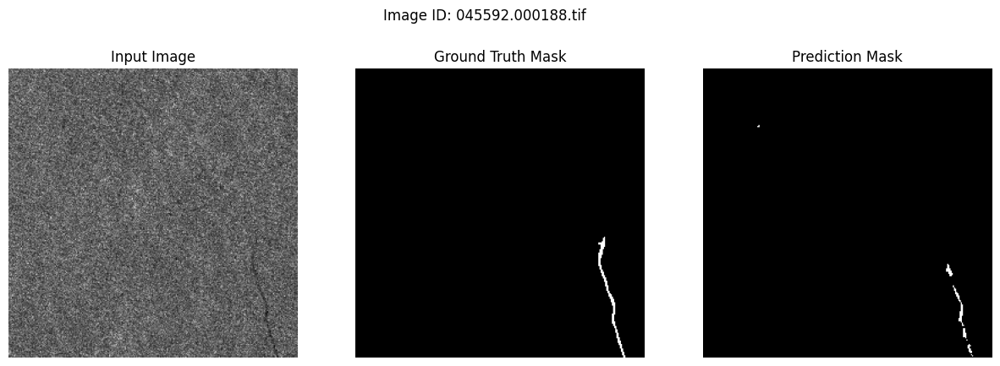

[PREDICT 32/50] Loss: 0.0413


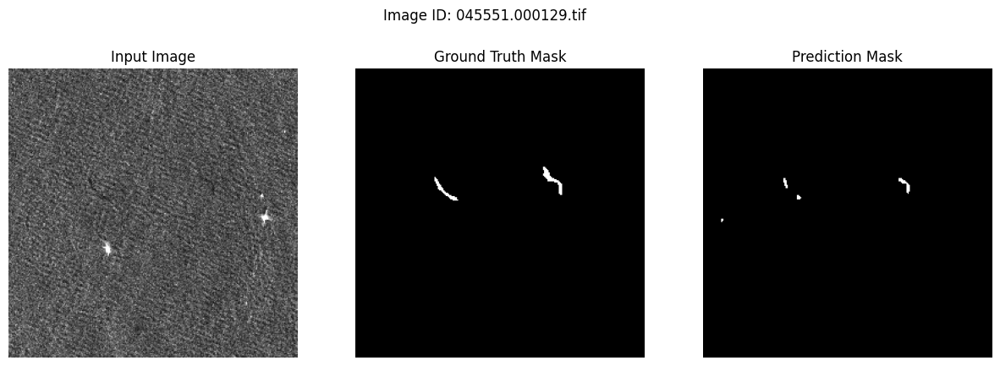

[PREDICT 33/50] Loss: 0.0555


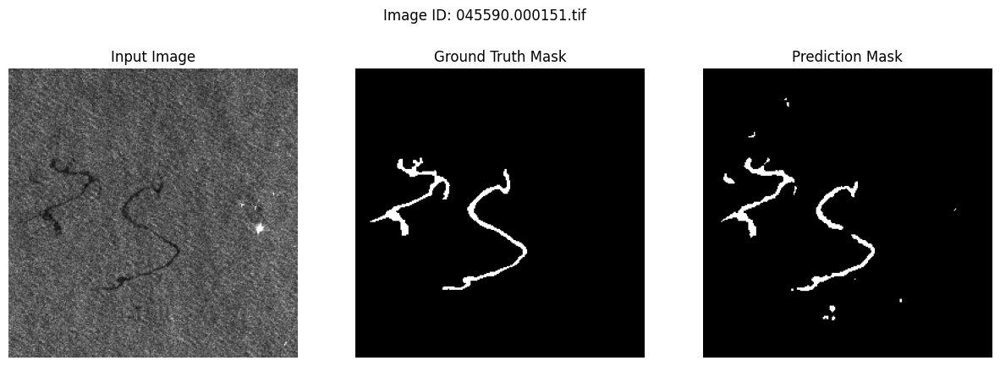

[PREDICT 34/50] Loss: 0.0481


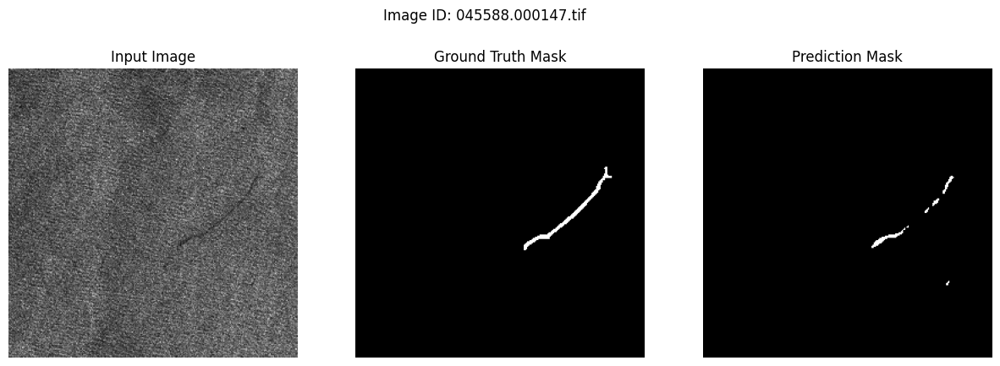

[PREDICT 35/50] Loss: 0.0370


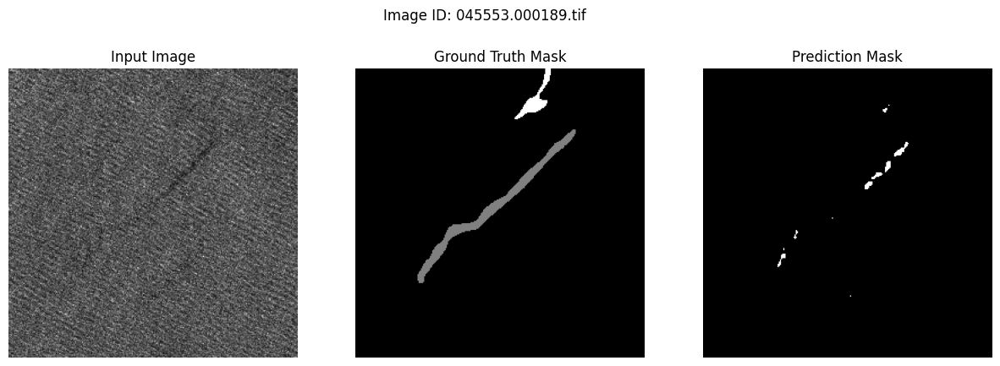

[PREDICT 36/50] Loss: 0.0333


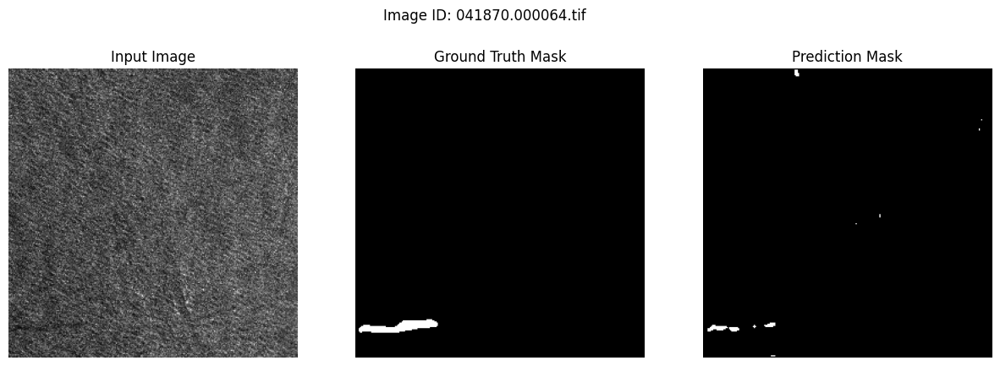

[PREDICT 37/50] Loss: 0.0857


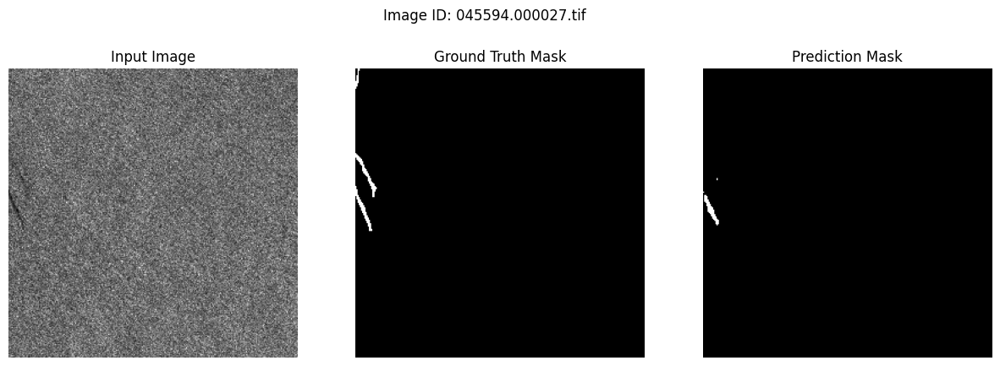

[PREDICT 38/50] Loss: 0.0624


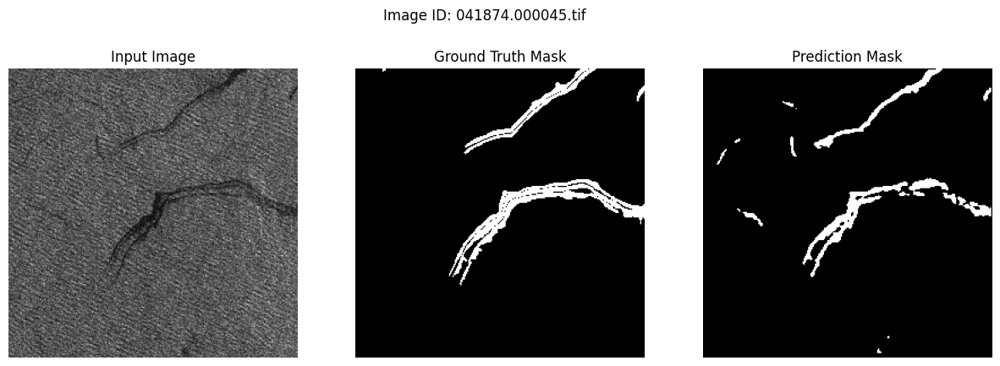

[PREDICT 39/50] Loss: 0.0814


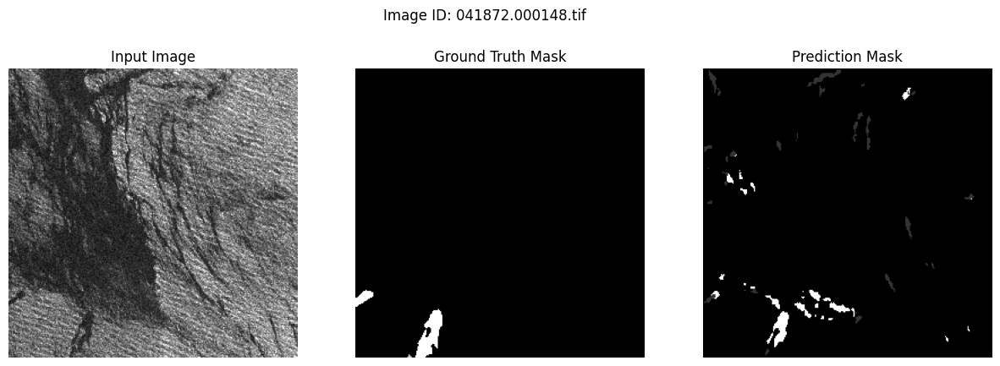

[PREDICT 40/50] Loss: 0.0803


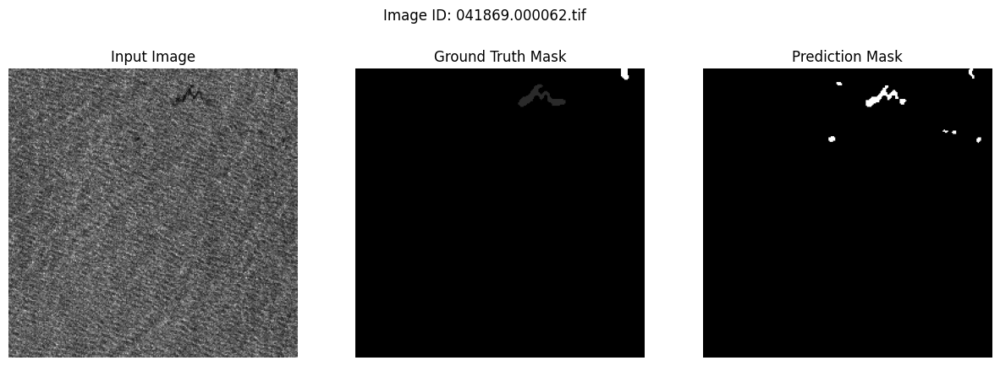

[PREDICT 41/50] Loss: 0.0252


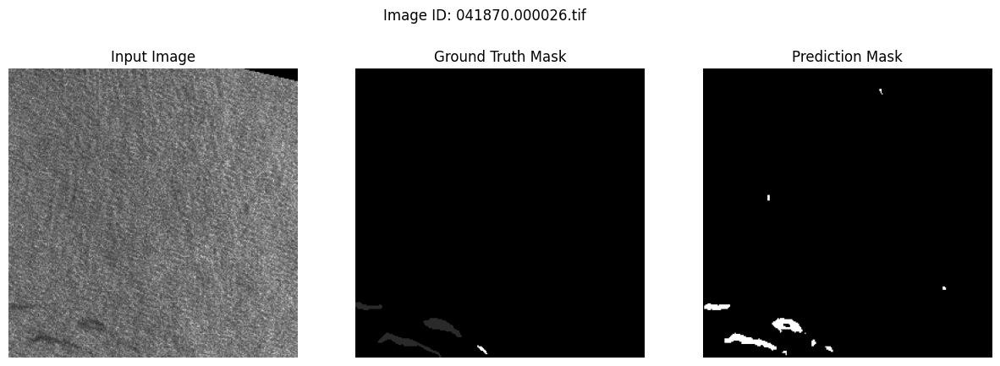

[PREDICT 42/50] Loss: 0.0422


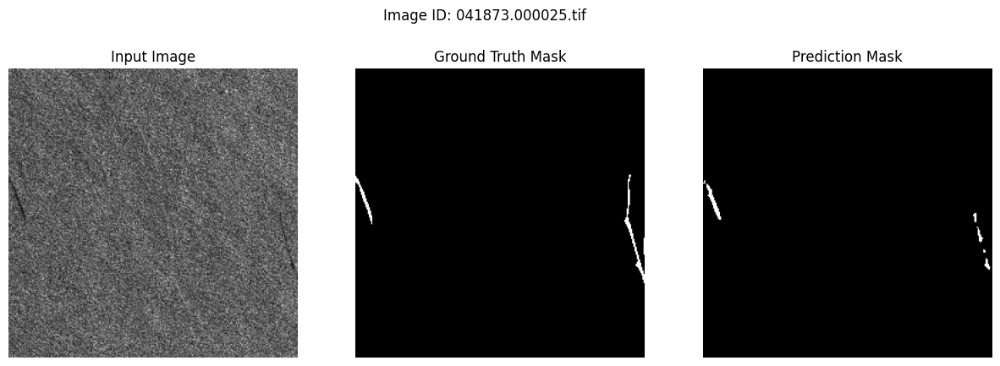

[PREDICT 43/50] Loss: 0.0486


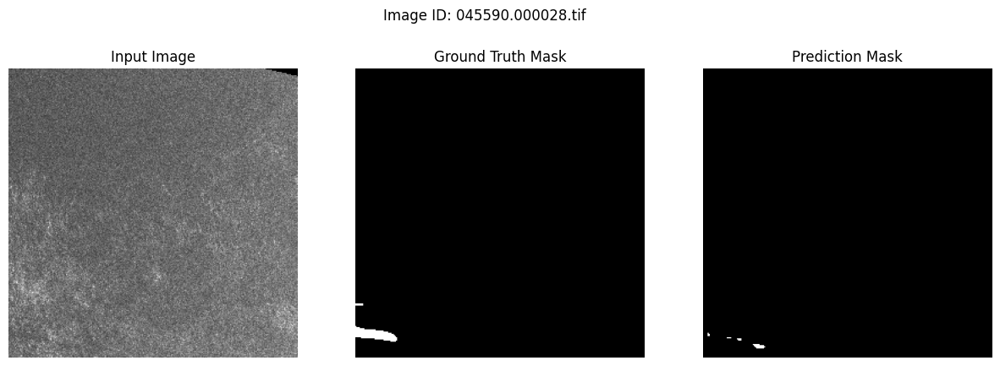

[PREDICT 44/50] Loss: 0.0350


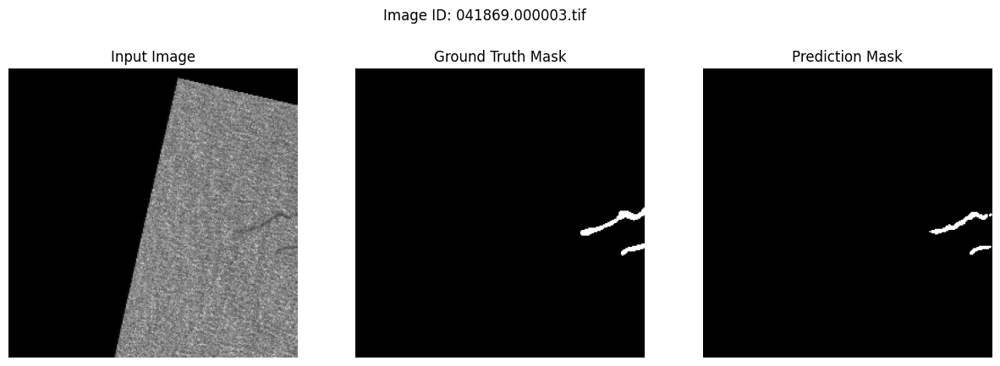

[PREDICT 45/50] Loss: 0.0465


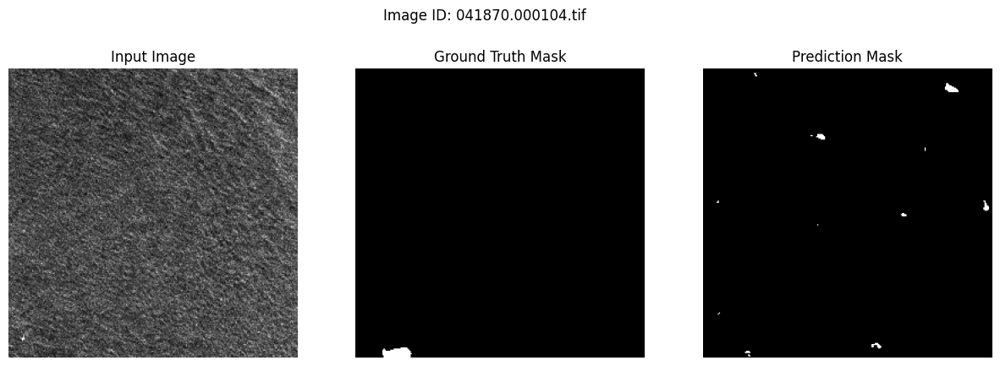

[PREDICT 46/50] Loss: 0.0674


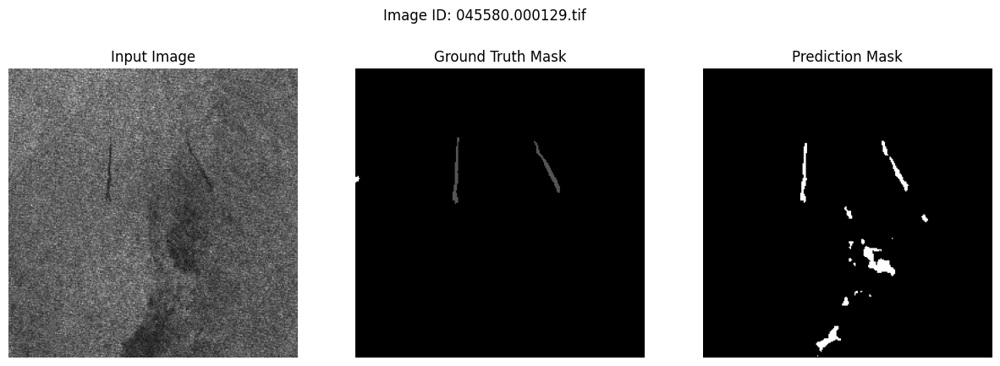

[PREDICT 47/50] Loss: 0.0697


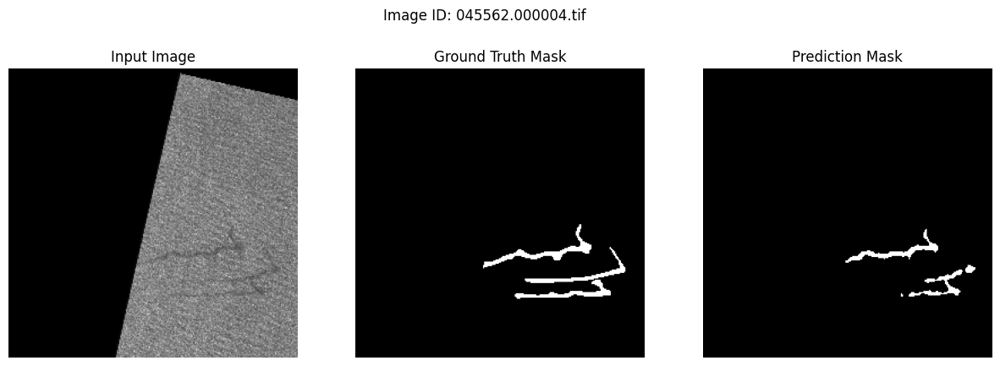

[PREDICT 48/50] Loss: 0.0473


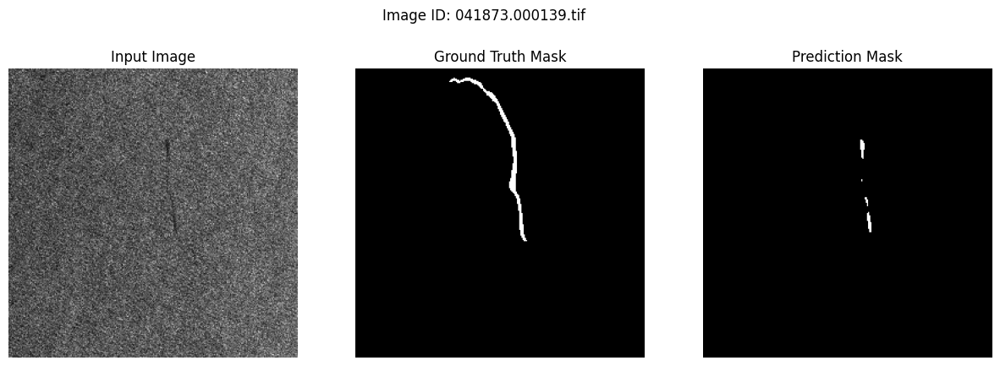

[PREDICT 49/50] Loss: 0.0444


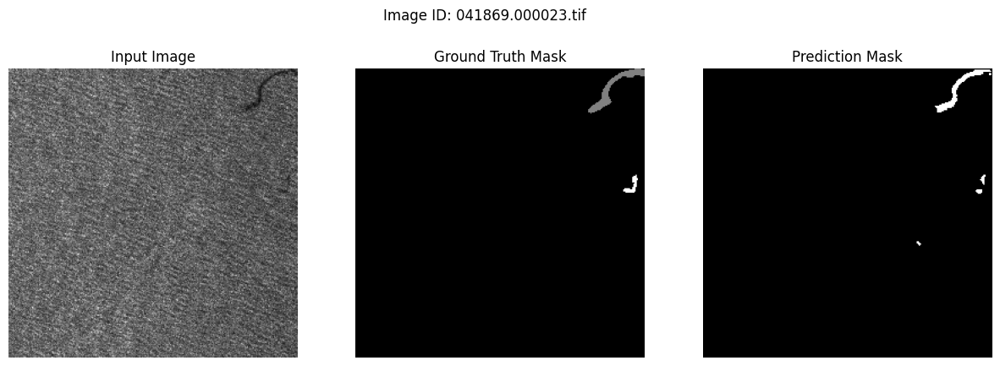

[PREDICT 50/50] Loss: 0.0708
FINAL PREDICT LOSS: 0.0555


In [ ]:
import time
import zipfile
import os
import glob
import torch
import torch.utils.data as data
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt  # Import matplotlib for visualization


class EarlyStopping:
    def __init__(self, patience=10, min_delta=0, mode='min', model=None, model_dir='model'):
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.best_score = None
        self.counter = 0
        self.early_stop = False
        self.model = model
        self.model_dir = model_dir

    def __call__(self, score):
        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint()
        elif self._is_improvement(score):
            self.best_score = score
            self.counter = 0
            self.save_checkpoint()
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

    def _is_improvement(self, score):
        if self.mode == 'min':
            return score < self.best_score - self.min_delta
        elif self.mode == 'max':
            return score > self.best_score + self.min_delta
        else:
            raise ValueError("Mode should be 'min' or 'max'")

    def save_checkpoint(self):
        if not os.path.exists(self.model_dir):
            print('Creating model directory: {}'.format(self.model_dir))
            os.makedirs(self.model_dir)
        torch.save(self.model.state_dict(), '{}/unet.pth'.format(self.model_dir))

    def load_checkpoint(self):
        self.model.load_state_dict(torch.load('{}/unet.pth'.format(self.model_dir)))
        return self.model

def save_predictions(predictions, filenames, output_directory):
    # Create the output directory if it does not exist
    if not os.path.exists(output_directory):
        print(f'Creating output directory: {output_directory}')
        os.makedirs(output_directory)

    # Iterate through each prediction and save it as an image file
    for idx, prediction in enumerate(predictions):
        prediction = torch.squeeze(prediction, dim=0)
        prediction_np = prediction.cpu().numpy().astype(np.uint8)  # Ensure the array is in uint8 format
        prediction_img = Image.fromarray(prediction_np)
        prediction_img.save(os.path.join(output_directory, filenames[idx]))


# Hyperparameters

epochs = 300
lr = 0.001
patience = 10
min_delta = 0.001

# Model, optimizer, and loss function
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(n_channels=1, n_classes=8).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
criterion = nn.CrossEntropyLoss()
es = EarlyStopping(patience=patience, min_delta=min_delta, mode='min', model=model, model_dir='model')

def train_one_epoch(epoch, model, dataloader, optimizer, criterion, device):
    model.train()
    train_loss = []

    for batch_idx, (img, mask, _) in enumerate(dataloader):
        img, mask = img.to(device), mask.to(device)
        optimizer.zero_grad()
        pred = model(img)
        loss = criterion(pred, mask)
        loss.backward()
        optimizer.step()
        train_loss.append(loss.item())

    avg_train_loss = np.mean(train_loss)
    print(f'[EPOCH {epoch}] Train Loss: {avg_train_loss:.4f}')
    return avg_train_loss

def validate_one_epoch(epoch, model, dataloader, criterion, device):
    model.eval()
    valid_loss = []

    with torch.no_grad():
        for batch_idx, (img, mask, _) in enumerate(dataloader):
            img, mask = img.to(device), mask.to(device)
            pred = model(img)
            loss = criterion(pred, mask)
            valid_loss.append(loss.item())

    avg_valid_loss = np.mean(valid_loss)
    print(f'[EPOCH {epoch}] Valid Loss: {avg_valid_loss:.4f}')
    return avg_valid_loss

def train_model(model, train_loader, valid_loader, optimizer, criterion, es, epochs, device):
    for epoch in range(1, epochs + 1):
        start_time = time.time()
        train_loss = train_one_epoch(epoch, model, train_loader, optimizer, criterion, device)
        valid_loss = validate_one_epoch(epoch, model, valid_loader, criterion, device)

        es(valid_loss)
        if es.early_stop:
            print('Early stopping criterion met')
            break
        else:
            if es.counter == 0:
                es.save_checkpoint()
                print('Saving current best model')
            print(f'Validation loss: {valid_loss:.4f}; Best validation loss so far: {es.best_score:.4f}; Consecutive non-improving epochs: {es.counter}')

        elapsed_time = time.time() - start_time
        print(f'Epoch {epoch} completed in {elapsed_time:.2f} seconds')

# Call the train_model function
train_model(model, train_loader, valid_loader, optimizer, criterion, es, epochs, device)

def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    eval_loss = []

    with torch.no_grad():
        for batch_idx, (img, mask, _) in enumerate(dataloader):
            img, mask = img.to(device), mask.to(device)
            pred = model(img)
            loss = criterion(pred, mask)
            eval_loss.append(loss.item())
            print(f'[EVALUATE {batch_idx + 1}/{len(dataloader)}] Eval Loss: {loss.item():.4f}')

    avg_eval_loss = np.mean(eval_loss)
    print(f'FINAL EVAL LOSS: {avg_eval_loss:.4f}')
    return avg_eval_loss

# Main Evaluation
print('------Evaluation---------')
model = es.load_checkpoint()
final_eval_loss = evaluate_model(model, eval_loader, criterion, device)


def visualize_prediction(img, mask, pred_mask, img_id):
    img = img.cpu().numpy().squeeze()
    mask = mask.cpu().numpy().squeeze()
    pred_mask = pred_mask.cpu().numpy().squeeze()

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img, cmap='gray')
    axes[0].set_title('Input Image')
    axes[0].axis('off')

    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title('Ground Truth Mask')
    axes[1].axis('off')

    axes[2].imshow(pred_mask, cmap='gray')
    axes[2].set_title('Prediction Mask')
    axes[2].axis('off')

    plt.suptitle(f'Image ID: {img_id}')
    plt.show()

def predict_and_save(model, dataloader, criterion, device, output_dir):
    model.eval()
    all_loss = []

    with torch.no_grad():
        for batch_idx, (img, mask, img_fns) in enumerate(dataloader):
            img, mask = img.to(device), mask.to(device)
            pred = model(img)
            loss = criterion(pred, mask)
            all_loss.append(loss.item())

            pred_mask = torch.argmax(F.softmax(pred, dim=1), dim=1)
            pred_mask = torch.chunk(pred_mask, chunks=eval_batch_size, dim=0)
            save_predictions(pred_mask, img_fns, output_dir)

            visualize_prediction(img[0], mask[0], pred_mask[0], img_fns[0])

            print(f'[PREDICT {batch_idx + 1}/{len(dataloader)}] Loss: {loss.item():.4f}')

    avg_loss = np.mean(all_loss)
    print(f'FINAL PREDICT LOSS: {avg_loss:.4f}')
    return avg_loss

# Main Prediction Call
print('------Prediction---------')
output_directory = 'output'
final_predict_loss = predict_and_save(model, all_loader, criterion, device, output_directory)